In [1]:
import pandas as pd
import time as tm
from glob import glob
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [10, 6.5]

from pytesdaq.processing import process_ivsweep, IVanalysis
from pytesdaq.processing import _iv_didv_tools as tools
from pytesdaq.processing import _iv_didv_tools_plotting as plot

import qetpy

from pytesdaq.io.hdf5 import H5Reader,H5Writer

/home/mwilliams/.local/lib/python3.6/site-packages/paramiko/transport.py:32: CryptographyDeprecationWarning: Python 3.6 is no longer supported by the Python core team. Therefore, support for it is deprecated in cryptography. The next release of cryptography (40.0) will be the last to support Python 3.6.
  from cryptography.hazmat.backends import default_backend


Wakepy using: jeepney (dbus)


In [2]:
savepath = '/sdata2/lbl/run4//automation/'
sweeppath =  '/sdata2/lbl/run4/raw/iv_didv_I4_D20230822_T162704/' # small TES '/sdata1/runs/run20/raw/iv_didv_I2_D20220914_T210929/' #Big TES
savename = 'Run4_herald_TES800x200'
chans = ['TES800x200']
#chans = ['Melange4pcHangingOuter']
figsavepath = '/home/mwilliams/plots/'

#rsh = 5e-3

In [3]:
import h5py as h5
test_file = '/sdata2/lbl/run4/raw/iv_didv_I4_D20230822_T162704/didv_I4_D20230822_T164005_F0001.hdf5'
file = h5.File( test_file, 'r' )
print( file.keys() )
print( file['adc1'].attrs.keys())
print(file['adc1'].attrs['connection2'])
print(file['detconfig1'].attrs.keys())
print(file['detconfig1'].attrs['tes_bias'])

<KeysViewHDF5 ['adc1', 'detconfig1']>
<KeysViewHDF5 ['adc_channel_indices', 'adc_conversion_factor', 'connection2', 'data_mode', 'nb_channels', 'nb_events', 'nb_samples', 'sample_rate', 'trig_channel', 'voltage_range']>
['detector:TES800x200' 'controller:starcryo1_3' 'tes:3']
<KeysViewHDF5 ['adc_channel_indices', 'adc_conversion_factor', 'adc_name', 'channel_list', 'channel_type', 'close_loop_norm', 'feedback_mode', 'feedback_polarity', 'feedback_resistance', 'lock_point_voltage', 'open_loop_full_norm', 'open_loop_preamp_norm', 'output_gain', 'output_offset', 'preamp_gain', 'shunt_resistance', 'signal_gen_current', 'signal_gen_frequency', 'signal_gen_onoff', 'signal_gen_phase_shift', 'signal_gen_shape', 'signal_gen_source', 'signal_gen_tes_resistance', 'signal_gen_voltage', 'signal_source', 'squid_bias', 'squid_turn_ratio', 'tes_bias']>
0.00049159164


In [4]:
h5read = H5Reader()
traces_temp, metadata = h5read.read_many_events(
    #filepath="/sdata1/runs/leiden_runs/run_25/run25/raw/iv_didv_I1_D20220228_T095151/didv_I1_D20220228_T103437_F0001.hdf5",
    #filepath="/sdata1/runs/leiden_runs/run_25/run25/raw/iv_didv_I1_D20220226_T182941/",
    filepath = sweeppath,
    nevents=0,
    output_format=2,
    detector_chans=chans,
    include_metadata=True,
)

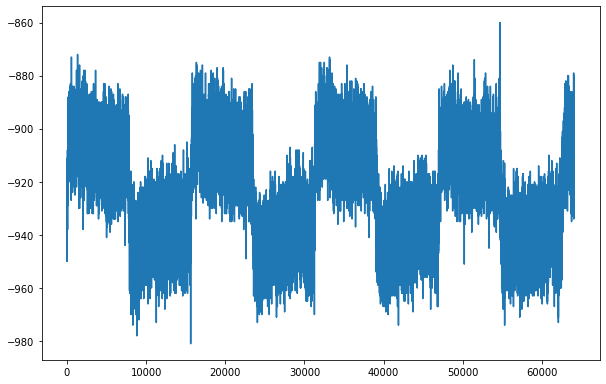

In [5]:
plt.plot(traces_temp[3, 0])
plt.show()
#plt.xlim(31000, 31500)

In [6]:
nfiles = len(glob(f'{sweeppath}*'))
print(f"There are {nfiles} files.")

There are 73 files.


In [7]:
start_time = tm.time()
df = process_ivsweep(
    ivfilepath=sweeppath,
    chans=chans,
    lgcverbose=False, # Switch to True to know which file its on
    lgcsave=True,
    savepath=savepath,
    savename=savename
)
end_time = tm.time()

#df.qetbias*= -1 

print(f'IV sweep took {(end_time - start_time)/60: .3f} min to process')

IV sweep took  9.586 min to process


In [8]:
#df.didvmean *= -1
#df.avgtrace *= -1
#df.psd *= -1

#print(len(df['cut_pass']))
#pass_arr = np.ones(len(df), dtype = bool)
#pass_arr[5] = False
#pass_arr[26+5] = False
#pass_arr[3] = False
#pass_arr[26+3] = False
#df['cut_pass'] = pass_arr

#print(df)
#print(df.sgamp)

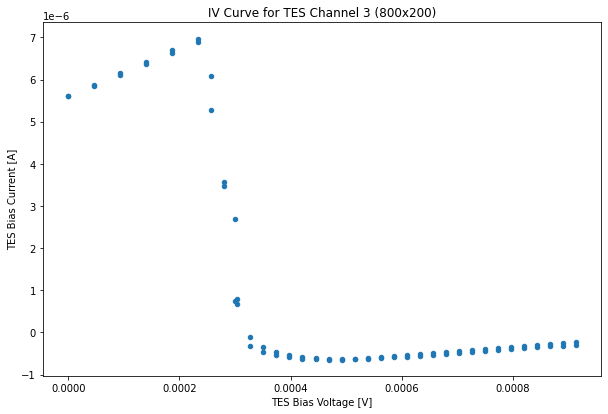

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have your DataFrame named df
# df = ...

# Plotting 'column1' against 'column2'
df.plot(x='qetbias', y='offset', kind='scatter')
plt.xlabel('TES Bias Voltage [V]')
plt.ylabel('TES Bias Current [A]')
plt.title('IV Curve for TES Channel 3 (800x200)')
plt.show()



In [10]:
IVobj_Run4 = IVanalysis(
    df, 
    rshunt = 5e-4,
    nnorm=22, # number of points in normal region
    nsc=6, # number of points in superconducting region
    lgcremove_badseries = True,
    figsavepath = figsavepath
)

In [ ]:
#print(IVobj_Run4.__dict__)

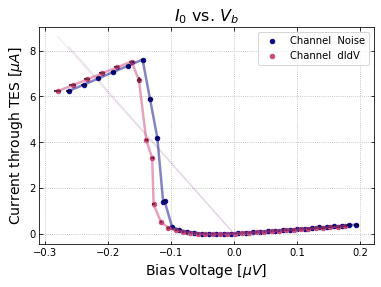

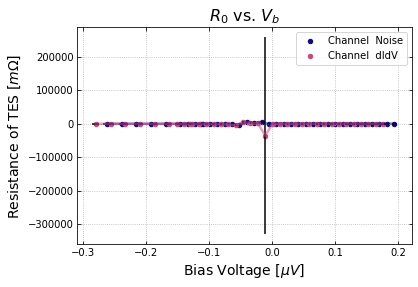

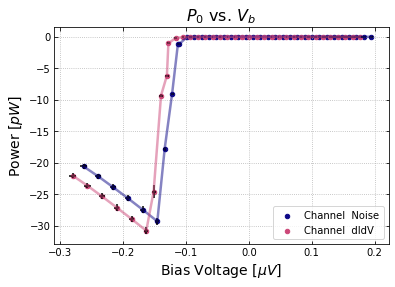

In [11]:

IVobj_Run4.rshunt_err = 0.1e-4
IVobj_Run4.analyze_sweep(lgcplot = True,lgcsave=False)
#IVobj_D_1217.analyze_sweep(lgcplot = True, lgcsave = True)
# dIdV fitting
#IVobj_Run4.fit_rload_rn(lgcplot = True,lgcsave=False)
#IVobj.fit_tran_didv(lgcplot = True)
# noise modeling
#IVobj.fit_normal_noise()
#IVobj.fit_sc_noise()
#IVobj.model_noise_simple()
# estimate expected baseline energy resolution
#IVobj.estimate_noise_errors()
#IVobj.find_optimum_bias()

In [11]:
#IVobj.rshunt_err = 0.1e-3
#IVobj.analyze_sweep(lgcplot = True)
# dIdV fitting
#IVobj.fit_rload_rn(lgcplot = True)
IVobj_Run4.fit_tran_didv(lgcplot = False,lgcsave=False, lp_cutoff = 50e3, zoomfactor = 0.1)
#IVobj_D_1217.fit_tran_didv(lgcplot = True, lgcsave = True)
# noise modeling
#IVobj.fit_normal_noise()
#IVobj.fit_sc_noise()
#IVobj.model_noise_simple()
# estimate expected baseline energy resolution
#IVobj.estimate_noise_errors()
#IVobj.find_optimum_bias()

/home/mwilliams/.local/lib/python3.6/site-packages/scipy/optimize/minpack.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
/home/mwilliams/.local/lib/python3.6/site-packages/scipy/optimize/minpack.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)


In [ ]:
IVobj_Run4.tc = 50e-3
IVobj_Run4.tbath = 49.5e-3
IVobj_Run4.tload = 65e-3

IVobj_Run4.Gta = 5 * IVobj_Run4.df[IVobj_Run4.didvinds].iloc[9]['ptes']/IVobj_Run4.tc
#print(IVobj_A.norminds)
#print(IVobj.noiseinds)

/home/mwilliams/.local/lib/python3.6/site-packages/qetpy/plotting/_noise_plotting.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(11, 6))


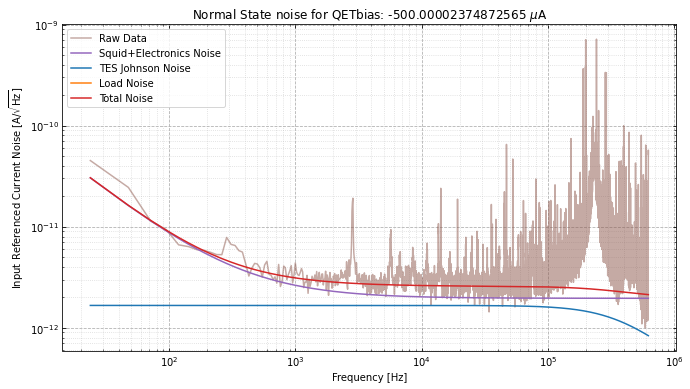

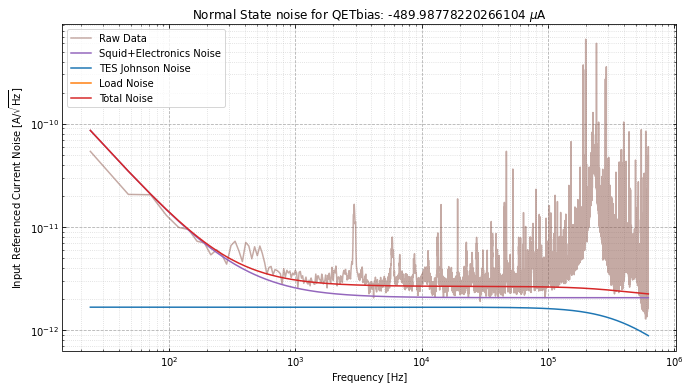

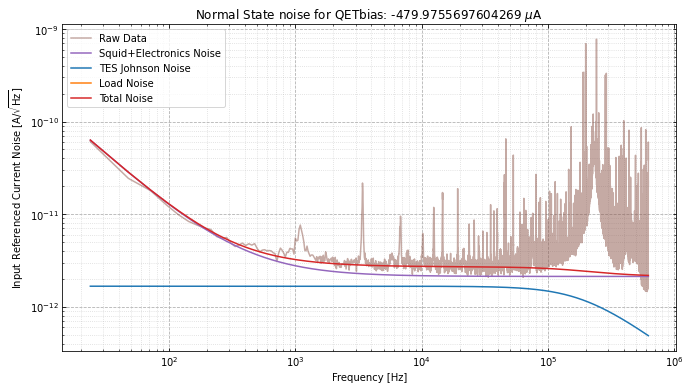

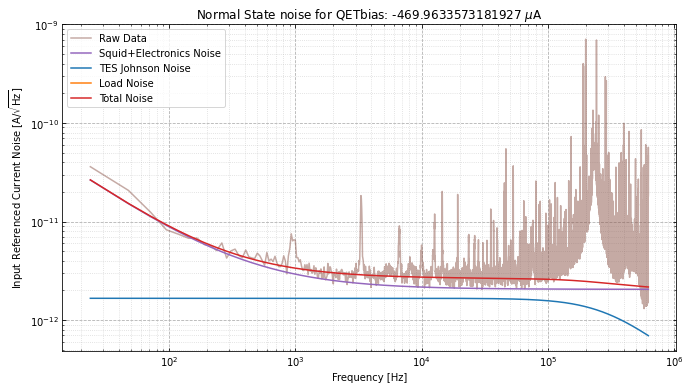

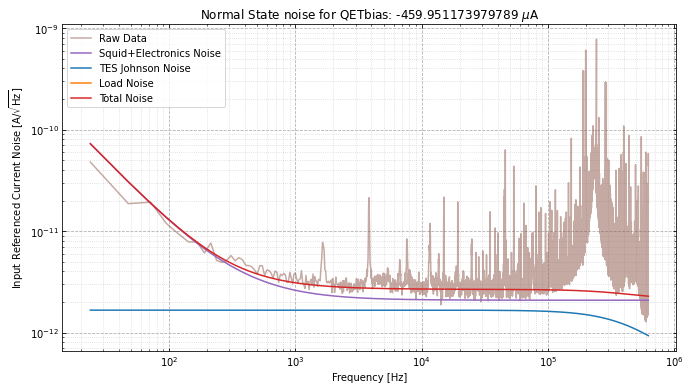

...

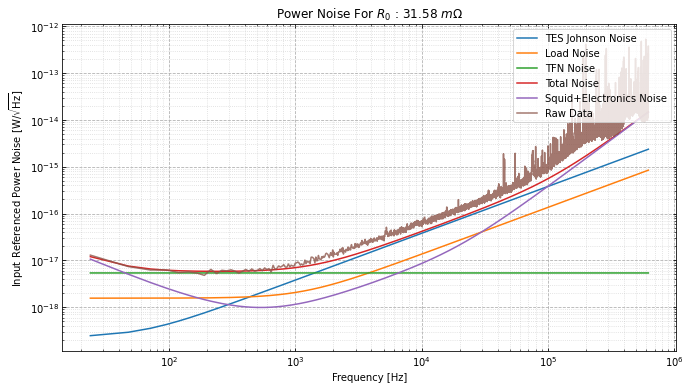

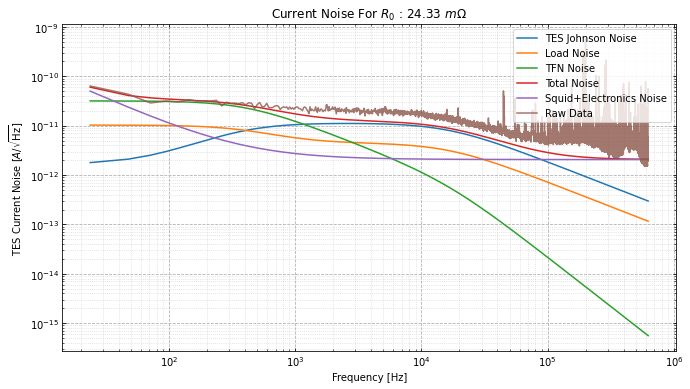

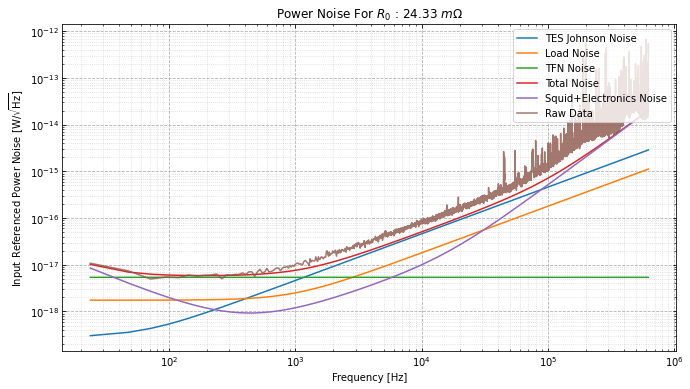

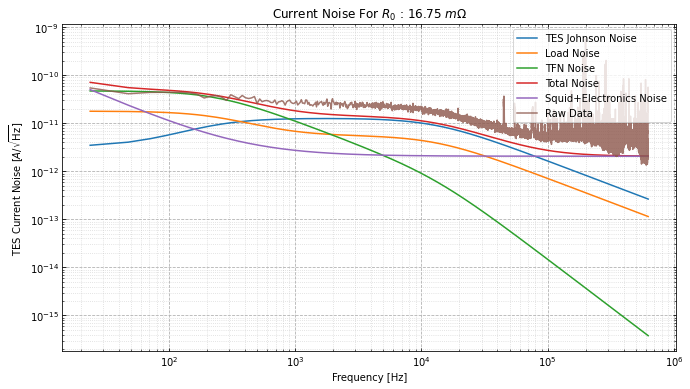

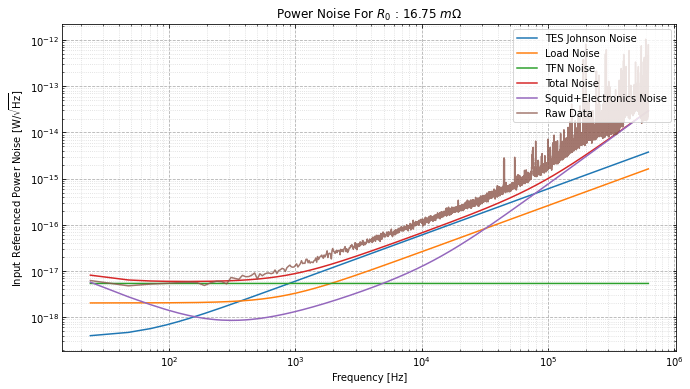

In [ ]:
#IVobj.rshunt_err = 0.1e-3
#IVobj.analyze_sweep(lgcplot = True)
# dIdV fitting
#IVobj.fit_rload_rn(lgcplot = True)
#IVobj.fit_tran_didv(lgcplot = True)
# noise modeling
IVobj_Run4.fit_normal_noise(fit_range = [1e2, 1e5], lgcplot = True, lgcsave = True)
IVobj_Run4.fit_sc_noise(fit_range = [1e2, 1e5], lgcplot = True, lgcsave = True)
IVobj_Run4.model_noise_simple(lgcplot = True, lgcsave = True, tau_collect = 250e-6)
# estimate expected baseline energy resolution
#IVobj.estimate_noise_errors()
#IVobj.find_optimum_bias()

In [ ]:
#IVobj.rshunt_err = 0.1e-3
#IVobj.analyze_sweep(lgcplot = True)
# dIdV fitting
#IVobj.fit_rload_rn(lgcplot = True)
#IVobj.fit_tran_didv(lgcplot = True)
# noise modeling
#IVobj.fit_normal_noise(fit_range = [1e2, 1e5], lgcplot = True)
#IVobj.fit_sc_noise(fit_range = [1e2, 1e5], lgcplot = True)
#IVobj.model_noise_simple(lgcplot = True)
# estimate expected baseline energy resolution
IVobj_Run4.estimate_noise_errors()

/home/mwilliams/.local/lib/python3.6/site-packages/pytesdaq/processing/_iv_didv_tools.py:1321: RuntimeWarning: covariance is not positive-semidefinite.
  nsamples,


(-0.00011489621829241514, 0.07937663158580861, 0.1997223068132183)

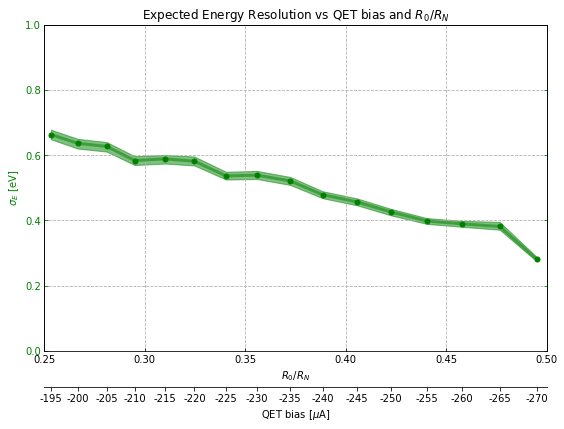

In [63]:
IVobj_Run4.find_optimum_bias(lgcplot = True, ylims = [0, 1],xlims=[0.25,0.5])

In [37]:
IVobj_Run4.noise_model['energy_res'][0]
trandf = IVobj_Run4.df.loc[IVobj_Run4.noiseinds].iloc[IVobj_Run4.traninds]
qets = trandf.qetbias.values
print(qets)

#for i,j in enumerate(qets):
#    print(i,j)

[-4.00122110e-04 -3.94993898e-04 -3.90109897e-04 -3.84981686e-04
 -3.80097685e-04 -3.74969473e-04 -3.70085472e-04 -3.64957261e-04
 -3.60073260e-04 -3.54945048e-04 -3.50061047e-04 -3.44932836e-04
 -3.40048835e-04 -3.34920624e-04 -3.30036622e-04 -3.24908411e-04
 -3.20024410e-04 -3.14896228e-04 -3.10012198e-04 -3.04884015e-04
 -3.00000014e-04 -2.95115984e-04 -2.89987802e-04 -2.85103772e-04
 -2.79975589e-04 -2.75091588e-04 -2.69963377e-04 -2.65079376e-04
 -2.59951164e-04 -2.55067163e-04 -2.49938952e-04 -2.45054951e-04
 -2.39926740e-04 -2.35042738e-04 -2.29914527e-04 -2.25030526e-04
 -2.19902315e-04 -2.15018314e-04 -2.09890117e-04 -2.05006101e-04
 -1.99877904e-04 -1.94993889e-04 -1.90109888e-04 -1.84981691e-04
 -1.80097675e-04 -1.74969478e-04 -1.70085477e-04 -1.64957266e-04
 -1.60073265e-04 -1.54945054e-04 -1.50061052e-04 -1.44932841e-04
 -1.40048840e-04 -1.34920629e-04 -1.30036628e-04 -1.24908431e-04
 -1.20024422e-04 -1.14896218e-04 -1.10012210e-04 -1.04884006e-04
 -9.99999975e-05 -9.51159

In [36]:
print(IVobj_Run4.noise_model['energy_res'][0])

[7.7246759  4.88964264 3.70765274 2.90815483 2.16022311 1.93841873
 1.51567943 1.40797738 1.12320487 0.87775379 0.69208137 0.59814271
 0.52813071 0.47603336 0.44680392 0.43775257 0.42798819 0.38331249
 0.3540353  0.40517535 0.37460468 0.41484163 0.39405176 0.30204348
 0.35088953 0.37200782 0.28069983 0.38127065 0.38917499 0.3979577
 0.42569685 0.45625302 0.47863844 0.52087683 0.53846131 0.53641806
 0.58122744 0.58851543 0.58333822 0.62665391 0.63620047 0.66306653
 0.63441206 0.65251396 0.69220088 0.69039323 0.69755085 0.70831286
 0.69983743 0.72327094 0.7322189  0.69283974 0.64325139 0.60726293
 0.31260846 0.62173059 0.2179662  0.19972231 0.57338902 0.49812465
 0.44401678 0.41082873 0.38845297 0.38993652 0.41571684 0.43726724
 0.46896018 0.53805529 0.62860753]


In [35]:
print(IVobj_Run4.noise_model['energy_res'][0][38])

0.5833382177027711


In [70]:
import scipy.constants as constants
def delta_energy_res(freqs, Sp, collection_eff):
    omega = 2*np.pi*freqs
    integrand = 2/(np.pi*Sp)
    delta_energy_res = np.sqrt(1/np.trapz(integrand, x = omega))/constants.e
    return delta_energy_res

delta_energy_res_arr = np.full(shape=sum(IVobj_Run4.noiseinds), fill_value=np.nan)
for ind in IVobj_Run4.traninds:
    noise_row = IVobj_Run4.df[IVobj_Run4.noiseinds].iloc[ind]
    f = noise_row.f
    psd = noise_row.psd
    didvobj = noise_row.didvobj

    noise_sim = tools.loadfromdidv(
        didvobj,
        G=IVobj_Run4.Gta,
        qetbias=noise_row.qetbias,
        tc=IVobj_Run4.tc,
        tload=IVobj_Run4.tload,
        tbath=IVobj_Run4.tbath,
        squiddc=IVobj_Run4.squiddc,
        squidpole=IVobj_Run4.squidpole,
        squidn=IVobj_Run4.squidn,
        noisetype='transition',
    )
    res = delta_energy_res(
        freqs=f,
        Sp=psd/(np.abs(noise_sim.dIdP(f))**2),
        collection_eff=1,
    )
    delta_energy_res_arr[ind] = res

In [71]:
delta_energy_res_arr

array([       nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
       7.38974818, 4.78913374, 3.67033898, 2.80431215, 2.15657312,
       1.93832764, 1.51487081, 1.40972529, 1.12250509, 0.87703388,
       0.69221006, 0.59717249, 0.52796642, 0.47570154, 0.44620899,
       0.43838057, 0.42794354, 0.41254005, 0.40892056, 0.4053885 ,
       0.37461354, 0.37410864, 0.35563545, 0.35279534, 0.35105469,
       0.34685588, 0.34840467, 0.36315374, 0.38916301, 0.39778121,
       0.4251943 , 0.45594404, 0.47856988, 0.5207987 , 0.53758294,
       0.53621117, 0.58130265, 0.58796529, 0.58284883, 0.62660467,
       0.6367274 , 0.66208525, 0.63325433, 0.65176259, 0.69217143,
       0.69140861, 0.69875884, 0.70818456, 0.70062745, 0.7233485 ,
       0.73298962, 0.6920673 , 0.6434312 , 0.60769862, 0.52178861,
       0.50377494, 0.41293443, 0.49895913, 0.57396767, 0.4985905 ,
       0.4427302 , 0.41116811, 0.38856084, 0.39023117, 0.41552

In [81]:
cleaned_res = []
cleaned_res = [x for x in delta_energy_res_arr if str(x) != 'nan']

In [83]:
cleaned_res[38]

0.582848832585153

In [17]:
print(IVobj_A.rload)
print(IVobj_A.rload * 32e-6)

NameError: name 'IVobj_A' is not defined

In [ ]:
print(IVobj_Run4.df[IVobj_Run4.didvinds])
print(IVobj_Run4.fitresult(3))

        channels                             seriesnum         fs  \
0   IrPtTESSmall  didv_I2_D20220914_T180303_F0001.hdf5  1250000.0   
1   IrPtTESSmall  didv_I2_D20220914_T180551_F0001.hdf5  1250000.0   
2   IrPtTESSmall  didv_I2_D20220914_T180839_F0001.hdf5  1250000.0   
3   IrPtTESSmall  didv_I2_D20220914_T181127_F0001.hdf5  1250000.0   
4   IrPtTESSmall  didv_I2_D20220914_T181414_F0001.hdf5  1250000.0   
..           ...                                   ...        ...   
56  IrPtTESSmall  didv_I2_D20220914_T204031_F0001.hdf5  1250000.0   
57  IrPtTESSmall  didv_I2_D20220914_T204318_F0001.hdf5  1250000.0   
58  IrPtTESSmall  didv_I2_D20220914_T204607_F0001.hdf5  1250000.0   
59  IrPtTESSmall  didv_I2_D20220914_T204856_F0001.hdf5  1250000.0   
60  IrPtTESSmall  didv_I2_D20220914_T205146_F0001.hdf5  1250000.0   

         qetbias     sgamp  sgfreq    offset    offset_err     f   psd  ...  \
0  -2.399267e-04  0.000001    50.0  0.000005  6.343077e-11  None  None  ...   
1  -2.299145e

AttributeError: 'IVanalysis' object has no attribute 'fitresult'

In [ ]:
print("Bias (uA), R0 (mOhms), I0 (nA), PTES (fW)")

for index, row in IVobj_Run4.df[IVobj_Run4.didvinds].iloc[0:-1].iterrows():
    print(
        f"{row['qetbias'] * 1e6:.1f}     ",
        f"{row['r0'] * 1e3:.1f}       ",
        f"{row['i0'] * 1e9:.1f}    ",
        f"{row['ptes'] * 1e15:.1f}    ",
        f"{row['didvobj'].fitresult(2).get('params', {'tau1':0}).get('tau1')*1e6:.1f}",
        f"{row['didvobj'].fitresult(2).get('params', {'tau2':0}).get('tau2')*1e6:.1f}",
        f"{row['didvobj'].fitresult(3).get('params', {'tau1':0}).get('tau1')*1e6:.1f}",
        f"{row['didvobj'].fitresult(3).get('params', {'tau2':0}).get('tau2')*1e6:.1f}",
        f"{row['didvobj'].fitresult(3).get('params', {'tau3':0}).get('tau3')*1e6:.1f}",
        #f"{row['didvobj'].fitresult(3)['falltimes'][0] * 1e6:.1f}",
        #f"{row['didvobj'].fitresult(3)['falltimes'][1] * 1e6:.1f}",
        #f"{row['didvobj'].fitresult(3)['falltimes'][2] * 1e6:.1f}",
    )
    
print("Bias (uA), R0 (mOhms), I0 (nA), PTES (fW), beta, tau1, tau2, tau, tau1, tau2, tau3")

for index, row in IVobj_Run4.df[IVobj_Run4.didvinds].iloc[0:-1].iterrows():
    print(
        f"{row['qetbias'] * 1e6:.1f}     ",
        f"{row['r0'] * 1e3:.1f}   ",
        f"{row['i0'] * 1e9:.1f}    ",
        f"{row['ptes'] * 1e15:.1f}    ",
        f"{row['didvobj'].fitresult(2).get('smallsignalparams', {'beta':0}).get('beta'):.3f}    ",
        f"{row['didvobj'].fitresult(2).get('params', {'tau1':0}).get('tau1')*1e6:.1f}",
        f"{row['didvobj'].fitresult(2).get('params', {'tau2':0}).get('tau2')*1e6:.1f}",
        f"{row['didvobj'].fitresult(3).get('params', {'tau1':0}).get('tau1')*1e6:.1f}",
        f"{row['didvobj'].fitresult(3).get('params', {'tau2':0}).get('tau2')*1e6:.1f}",
        f"{row['didvobj'].fitresult(3).get('params', {'tau3':0}).get('tau3')*1e6:.1f}",
    )

Bias (uA), R0 (mOhms), I0 (nA), PTES (fW)
-239.9      1486.3        -812.8     982.0     0.0 0.0 0.0 0.0 0.0
-229.9      1488.3        -778.5     901.9     0.0 0.0 0.0 0.0 0.0
-219.9      1487.8        -745.4     826.8     0.0 0.0 0.0 0.0 0.0
-209.9      1487.4        -712.4     754.8     0.0 0.0 0.0 0.0 0.0
-199.9      1487.9        -678.9     685.7     0.0 0.0 0.0 0.0 0.0
-190.1      1487.5        -646.6     621.9     0.0 0.0 0.0 0.0 0.0
-180.1      1489.5        -612.5     558.8     0.0 0.0 0.0 0.0 0.0
-170.1      1488.9        -579.5     500.0     0.0 0.0 0.0 0.0 0.0
-160.1      1488.3        -546.5     444.5     0.0 0.0 0.0 0.0 0.0
-150.1      1484.5        -514.5     393.0     0.0 0.0 0.0 0.0 0.0
-140.0      1478.5        -483.1     345.1     615.9 0.4 594.6 0.4 64.6
-137.1      1475.8        -474.2     331.8     763.9 0.4 629.2 0.4 17.3
-133.9      1470.1        -465.3     318.3     767.1 0.5 733.7 0.5 8.3
-131.0      1461.0        -458.3     306.8     841.5 0.7 686.6 0.7 440.3


/home/mwilliams/.local/lib/python3.6/site-packages/qetpy/core/didv/_base_didv.py:1080: UserWarning: The 2-pole fit has not been run, returning an empty dict.
  "The 2-pole fit has not been run, "
/home/mwilliams/.local/lib/python3.6/site-packages/qetpy/core/didv/_base_didv.py:1090: UserWarning: The 3-pole fit has not been run, returning an empty dict.
  "The 3-pole fit has not been run, "


In [ ]:
rshunt = 5e-3
print(IVobj_Run4.df.keys())
print(np.asarray(IVobj_Run4.df['qetbias']) * rshunt * 1e6)
print(IVobj_Run4.df['offset'])
print("r0 " + str(IVobj_Run4.df['r0']))
print("rp " + str(IVobj_Run4.df['rp']))

Index(['channels', 'seriesnum', 'fs', 'qetbias', 'sgamp', 'sgfreq', 'offset',
       'offset_err', 'f', 'psd', 'avgtrace', 'didvmean', 'didvstd', 'datatype',
       'cut_eff', 'cut', 'cut_pass', 'dutycycle', 'didvobj', 'didvobj_p',
       'ptes', 'ptes_err', 'r0', 'r0_err', 'rp', 'rp_err', 'i0', 'i0_err',
       'energy_res', 'tau_eff'],
      dtype='object')
[-1.19963370e+00 -1.19963370e+00 -1.14957264e+00 -1.14957264e+00
 -1.09951157e+00 -1.09951157e+00 -1.04945058e+00 -1.04945058e+00
 -9.99389522e-01 -9.99389522e-01 -9.50549438e-01 -9.50549438e-01
 -9.00488376e-01 -9.00488376e-01 -8.50427386e-01 -8.50427386e-01
 -8.00366324e-01 -8.00366324e-01 -7.50305262e-01 -7.50305262e-01
 -7.00244200e-01 -7.00244200e-01 -6.85592167e-01 -6.85592167e-01
 -6.69719157e-01 -6.69719157e-01 -6.55067124e-01 -6.55067124e-01
 -6.40415165e-01 -6.40415165e-01 -6.24542154e-01 -6.24542154e-01
 -6.09890121e-01 -6.09890121e-01 -5.95238089e-01 -5.95238089e-01
 -5.80586093e-01 -5.80586093e-01 -5.64713082e-01 -5.6

In [ ]:
IVobj_Run4.df[IVobj_Run4.didvinds]

In [ ]:
IVobj_Run4.df[IVobj_Run4.didvinds].iloc[0:-1].iterrows() ['didvobj'].fitresult(2).get('params', {'tau2':0}).get('tau2')*1e6

In [ ]:
IVobj_Run4.df[IVobj_Run4.didvinds].iterrows()['didvobj'].iloc[0:-1]#.fitresult(2).get('params', {'tau1':0}).get('tau1'))

In [ ]:
counts = 0
risesum = 0
fallsum = 0

for index, row in IVobj_Run4.df[IVobj_Run4.didvinds].iloc[0:-1].iterrows():
    print(
        f"{row['didvobj'].fitresult(2).get('params', {'tau1':0}).get('tau1')*1e6:.1f}",
        f"{row['didvobj'].fitresult(2).get('params', {'tau2':0}).get('tau2')*1e6:.1f}"
    )
    fallsum += row['didvobj'].fitresult(2).get('params', {'tau2':0}).get('tau2')*1e6
    risesum += row['didvobj'].fitresult(2).get('params', {'tau1':0}).get('tau1')*1e6

    counts += 1

riseaverage = risesum/counts
fallaverage = fallsum/counts

print(riseaverage)
print(fallaverage)


In [ ]:
print(IVobj_Run4.__dict__)

{'df':          channels                             seriesnum         fs  \
0    IrPtTESSmall  didv_I2_D20220914_T180303_F0001.hdf5  1250000.0   
61   IrPtTESSmall    iv_I2_D20220914_T180144_F0001.hdf5  1250000.0   
1    IrPtTESSmall  didv_I2_D20220914_T180551_F0001.hdf5  1250000.0   
62   IrPtTESSmall    iv_I2_D20220914_T180432_F0001.hdf5  1250000.0   
2    IrPtTESSmall  didv_I2_D20220914_T180839_F0001.hdf5  1250000.0   
..            ...                                   ...        ...   
119  IrPtTESSmall    iv_I2_D20220914_T204447_F0001.hdf5  1250000.0   
59   IrPtTESSmall  didv_I2_D20220914_T204856_F0001.hdf5  1250000.0   
120  IrPtTESSmall    iv_I2_D20220914_T204736_F0001.hdf5  1250000.0   
60   IrPtTESSmall  didv_I2_D20220914_T205146_F0001.hdf5  1250000.0   
121  IrPtTESSmall    iv_I2_D20220914_T205026_F0001.hdf5  1250000.0   

          qetbias     sgamp  sgfreq    offset    offset_err  \
0   -2.399267e-04  0.000001    50.0  0.000005  6.343077e-11   
61  -2.399267e-04       Na

In [ ]:
IVobj_Run4.df[IVobj_Run4.didvinds].iloc[:, 10:] 

,avgtrace,didvmean,didvstd,datatype,cut_eff,cut,cut_pass,dutycycle,didvobj,didvobj_p,ptes,ptes_err,r0,r0_err,rp,rp_err,i0,i0_err,energy_res,tau_eff
0,"[5.046766797701517e-06, 5.046714762846628e-06,...","[(0.5-0.5j), (0.5-0.5j), (0.7203558393801015+0...","[(1e+20+1e+20j), (1e+20+1e+20j), (0.0033115313...",didv,0.24,"[False, True, False, False, False, False, True...",True,0.5,<qetpy.core.didv._didv.DIDV object at 0x7f7759...,<qetpy.core.didv._didv.DIDV object at 0x7f775c...,9.819599e-13,1.979887e-14,1.486283,0.029967,0.011993,0.00024,-8.128233e-07,1.259259e-10,NaN,NaN
1,"[5.080451667308807e-06, 5.08623069524765e-06, ...","[(0.5-0.5j), (0.5-0.5j), (0.6852257689455512-0...","[(1e+20+1e+20j), (1e+20+1e+20j), (0.0046166721...",didv,0.08,"[True, False, False, False, False, False, Fals...",True,0.5,<qetpy.core.didv._didv.DIDV object at 0x7f7759...,<qetpy.core.didv._didv.DIDV object at 0x7f775c...,9.019400e-13,1.818518e-14,1.488317,0.030008,0.011993,0.00024,-7.784686e-07,1.106513e-10,NaN,NaN
2,"[5.117728789647421e-06, 5.1133555968602495e-06...","[(0.5-0.5j), (0.5-0.5j), (0.6459005753145123+0...","[(1e+20+1e+20j), (1e+20+1e+20j), (0.0044996045...",didv,0.12,"[True, False, False, False, False, False, Fals...",True,0.5,<qetpy.core.didv._didv.DIDV object at 0x7f7759...,<qetpy.core.didv._didv.DIDV object at 0x7f775c...,8.267839e-13,1.667004e-14,1.487838,0.029999,0.011993,0.00024,-7.454493e-07,1.228668e-10,NaN,NaN
3,"[5.148331415653228e-06, 5.147769105434418e-06,...","[(0.5-0.5j), (0.5-0.5j), (0.7096918021481238+0...","[(1e+20+1e+20j), (1e+20+1e+20j), (0.0047891149...",didv,0.40,"[False, False, True, True, False, False, True,...",True,0.5,<qetpy.core.didv._didv.DIDV object at 0x7f7759...,<qetpy.core.didv._didv.DIDV object at 0x7f775c...,7.548345e-13,1.521943e-14,1.487441,0.029991,0.011993,0.00024,-7.123706e-07,1.219001e-10,NaN,NaN
4,"[5.179485582536268e-06, 5.181299378795009e-06,...","[(0.5-0.5j), (0.5-0.5j), (0.6949141610575976+0...","[(1e+20+1e+20j), (1e+20+1e+20j), (0.0061357117...",didv,0.31,"[False, False, False, True, False, False, Fals...",True,0.5,<qetpy.core.didv._didv.DIDV object at 0x7f7759...,<qetpy.core.didv._didv.DIDV object at 0x7f775c...,6.857497e-13,1.382652e-14,1.487914,0.030000,0.011993,0.00024,-6.788814e-07,1.214708e-10,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,"[1.9973845299747255e-06, 1.997002732422617e-06...","[(0.5-0.5j), (0.5-0.5j), (108.6339550739608-1....","[(1e+20+1e+20j), (1e+20+1e+20j), (0.0075265363...",didv,0.72,"[True, False, True, True, False, False, True, ...",True,0.5,<qetpy.core.didv._didv.DIDV object at 0x7f7759...,<qetpy.core.didv._didv.DIDV object at 0x7f775c...,-3.423381e-14,5.331857e-15,-0.002004,0.000312,0.011993,0.00024,-4.132863e-06,1.165325e-10,NaN,NaN
57,"[3.0304958875789195e-06, 3.0299728304840795e-0...","[(0.5-0.5j), (0.5-0.5j), (108.7785884570365-1....","[(1e+20+1e+20j), (1e+20+1e+20j), (0.0075932859...",didv,0.43,"[True, True, False, True, False, False, False,...",True,0.5,<qetpy.core.didv._didv.DIDV object at 0x7f7759...,<qetpy.core.didv._didv.DIDV object at 0x7f775c...,-1.586119e-15,3.238945e-15,-0.000165,0.000337,0.011993,0.00024,-3.100686e-06,1.169451e-10,NaN,NaN
58,"[4.0565397398812415e-06, 4.056922231401715e-06...","[(0.49999999999999994-0.49999999999999994j), (...","[(1e+20+1e+20j), (1e+20+1e+20j), (0.0097647353...",didv,0.49,"[False, False, True, False, True, False, True,...",True,0.5,<qetpy.core.didv._didv.DIDV object at 0x7f7759...,<qetpy.core.didv._didv.DIDV object at 0x7f775c...,1.484014e-14,1.683341e-15,0.003447,0.000391,0.011993,0.00024,-2.074858e-06,1.211057e-10,NaN,NaN
59,"[5.078144941574488e-06, 5.078705604259785e-06,...","[(0.5-0.5j), (0.5-0.5j), (108.72045471195297-1...","[(1e+20+1e+20j), (1e+20+1e+20j), (0.0050341963...",didv,0.78,"[True, False, True, True, True, True, True, Tr...",True,0.5,<qetpy.core.didv._didv.DIDV object at 0x7f7759...,<qetpy.core.didv._didv.DIDV object at 0x7f775c...,1.553332e-14,6.344018e-16,0.014

In [ ]:
print(IVobj_Run4.tc)
print(IVobj_Run4.dites)
print(IVobj_Run4.ivobj)

0.0761
[[[ 5.04488871e-06  5.07792196e-06  5.11185526e-06  5.14552133e-06
    5.17862560e-06  5.21115188e-06  5.24462975e-06  5.27750543e-06
    5.31032342e-06  5.34296525e-06  5.37461948e-06  5.38319902e-06
    5.39233417e-06  5.39960739e-06  5.40572289e-06  5.40954773e-06
    5.40831811e-06  5.40482424e-06  5.39883810e-06  5.39075408e-06
    5.38204214e-06  5.37217242e-06  5.36055154e-06  5.34888577e-06
    5.33670286e-06  5.32301417e-06  5.30658132e-06  5.29050806e-06
    5.27291213e-06  5.25151789e-06  5.23079669e-06  5.20719856e-06
    5.18112239e-06  5.15053317e-06  5.11944299e-06  5.08546617e-06
    5.04363928e-06  5.00112560e-06  4.95351403e-06  4.90055788e-06
    4.83482505e-06  4.76530758e-06  4.68493288e-06  4.58369242e-06
    4.47088116e-06  4.33572672e-06  4.16952221e-06  3.93888422e-06
    3.65060983e-06  3.23123803e-06  2.41617344e-06 -3.58366265e-06
   -2.55459674e-06 -1.52546250e-06 -4.99814932e-07  6.55656342e-07
    1.68365042e-06  2.71830864e-06  3.74484705e-06  4.7

In [ ]:
print(IVobj_Run4.ibias)
print(IVobj_Run4.tload)
print(IVobj_Run4.vb)

[[[-2.39926740e-04 -2.29914527e-04 -2.19902315e-04 -2.09890117e-04
   -1.99877904e-04 -1.90109888e-04 -1.80097675e-04 -1.70085477e-04
   -1.60073265e-04 -1.50061052e-04 -1.40048840e-04 -1.37118433e-04
   -1.33943831e-04 -1.31013425e-04 -1.28083033e-04 -1.24908431e-04
   -1.21978024e-04 -1.19047618e-04 -1.16117219e-04 -1.12942616e-04
   -1.10012210e-04 -1.07081811e-04 -1.03907201e-04 -1.00976802e-04
   -9.80463980e-05 -9.51159951e-05 -9.19413919e-05 -8.90109890e-05
   -8.60805861e-05 -8.29059829e-05 -7.99755800e-05 -7.70451770e-05
   -7.41147741e-05 -7.09401709e-05 -6.80097680e-05 -6.50793651e-05
   -6.19047619e-05 -5.89743590e-05 -5.60439560e-05 -5.31135531e-05
   -4.99389499e-05 -4.70085470e-05 -4.40781441e-05 -4.09035409e-05
   -3.79731380e-05 -3.50427350e-05 -3.21123321e-05 -2.89377289e-05
   -2.60073260e-05 -2.30769231e-05 -1.99023199e-05 -1.79487179e-05
   -1.59951160e-05 -1.40415140e-05 -1.20879121e-05 -9.89010989e-06
   -7.93650794e-06 -5.98290598e-06 -4.02930403e-06 -2.07570208

In [ ]:
print(IVobj_Run4.traninds)
print(IVobj_Run4.rn_didv)
print(IVobj_Run4.Gta)
print(IVobj_Run4.rp_iv)

range(10, 49)
1.4274932728632515
2.58226029469706e-11
0.019729497101235685


In [ ]:
print(IVobj_Run4.didvinds)

0       True
61     False
1       True
62     False
2       True
       ...  
119    False
59      True
120    False
60      True
121    False
Name: datatype, Length: 122, dtype: bool


In [ ]:
for index, row in IVobj_Run4.df[IVobj_Run4.chname].iloc[0:-1].iterrows():
    print(row)

KeyError: ''

In [ ]:
IVobj_Run4.df[IVobj_Run4.chname]

KeyError: ''

In [ ]:
IVobj_Run4.df.iloc[0]

channels                                           IrPtTESSmall
seriesnum                  didv_I2_D20220914_T180303_F0001.hdf5
fs                                                     1.25e+06
qetbias                                            -0.000239927
sgamp                                                     1e-06
sgfreq                                                       50
offset                                              5.04551e-06
offset_err                                          6.34308e-11
f                                                          None
psd                                                        None
avgtrace      [5.046766797701517e-06, 5.046714762846628e-06,...
didvmean      [(0.5-0.5j), (0.5-0.5j), (0.7203558393801015+0...
didvstd       [(1e+20+1e+20j), (1e+20+1e+20j), (0.0033115313...
datatype                                                   didv
cut_eff                                                    0.24
cut           [False, True, False, False